<a href="https://colab.research.google.com/github/JudsonLima/computationalImaging/blob/master/HW3_JudsonLimaFinal1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Computational Imaging HW 3

Judson Lima

OPTI 556, Fall 2023

##Libraries

In [36]:
import numpy as np
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import layers, models
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.models import Model
from tensorflow.keras.activations import gelu, elu, sigmoid, swish, relu
import matplotlib.pyplot as plt
from scipy import interpolate as interp
from scipy.special import expit
from google.colab import files
from skimage.metrics import mean_squared_error as mse
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import imageio
from PIL import Image
import cv2
import os
%matplotlib inline
plt.rcParams['figure.figsize'] = [20, 10]
tf.experimental_relax_shapes=True

### Activation functions

The structure of the activation function is the backbone to the operation of neural networks. depicted below are the common activation functions used for the success of multilayer backpropagation learning. The vanishing gradient problem, where the derivative vanishes over the range, is a particular issue amoung the use of different activation functions. The gelu and elu are attempts at solving this problem. It can be noted that structure of the activation function itself can be a trainable parameter.

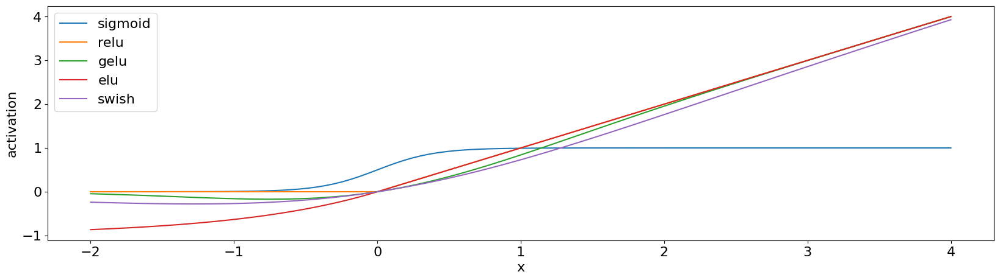

In [2]:
#
# relu, sigmoid and softmax optimization functions
#
plt.rcParams['figure.figsize'] = [20, 5]
plt.rcParams.update({'font.size': 16})
x=np.linspace(-2,4,100)
plt.plot(x,sigmoid(5*x),label='sigmoid')
plt.plot(x,relu(x),label='relu')
plt.plot(x,gelu(x),label='gelu')
plt.plot(x,elu(x),label='elu')
plt.plot(x,swish(x),label='swish')
plt.xlabel('x')
plt.ylabel('activation')
plt.legend()

In [7]:
!pip install visualkeras
import visualkeras

In [8]:
!pip install rawpy
import rawpy

## Demosaicing with neural processing



Training data set:

The Kodak photo cd data set, which was digitized from film as raw, is used for training. 24 images are broken down into sub images to get more trainable sets for the algorithm.

These images were never sampled uisng CFA and are raw rgb images.

image set comes from https://www.kaggle.com/datasets/sherylmehta/kodak-dataset?select=kodim24.png and are available as in png format.

In [82]:
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim01.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim02.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim03.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim04.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim05.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim06.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim07.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim08.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim09.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim10.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim11.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim12.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim13.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim14.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim15.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim16.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim17.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim18.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim19.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim20.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim21.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim22.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim23.png'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim24.png'

--2023-10-04 05:46:09--  https://github.com/JudsonLima/computationalImaging/raw/master/images/Kodakim/kodim01.png
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/Kodakim/kodim01.png [following]
--2023-10-04 05:46:10--  https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/Kodakim/kodim01.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 736501 (719K) [image/png]
Saving to: ‘kodim01.png.1’

kodim01.png.1       100%[===================>] 719.24K  --.-KB/s    in 0.05s   

2023-10-04 05:46:10 (13.1 MB/s) - ‘kodim01.png.1’ save

In [84]:
im=np.zeros((24,512,768,3))
for pop in range(1,9):
  fileN="kodim0"+str(pop)+".png"
  imm = Image.open(fileN)
  imm=np.array(imm)
  w,h,c =imm.shape
  if w>h:
    imm=imm.transpose(1,0,2)
  im[pop-1,:,:,:]=np.array(imm)/255.
for pop in range(10,24):
  fileN="kodim"+str(pop)+".png"
  imm = Image.open(fileN)
  imm=np.array(imm)
  w,h, c =imm.shape
  if w>h:
    imm=imm.transpose(1,0,2)
  im[pop-1,:,:,:]=np.array(imm)/255.

(-0.5, 767.5, 511.5, -0.5)

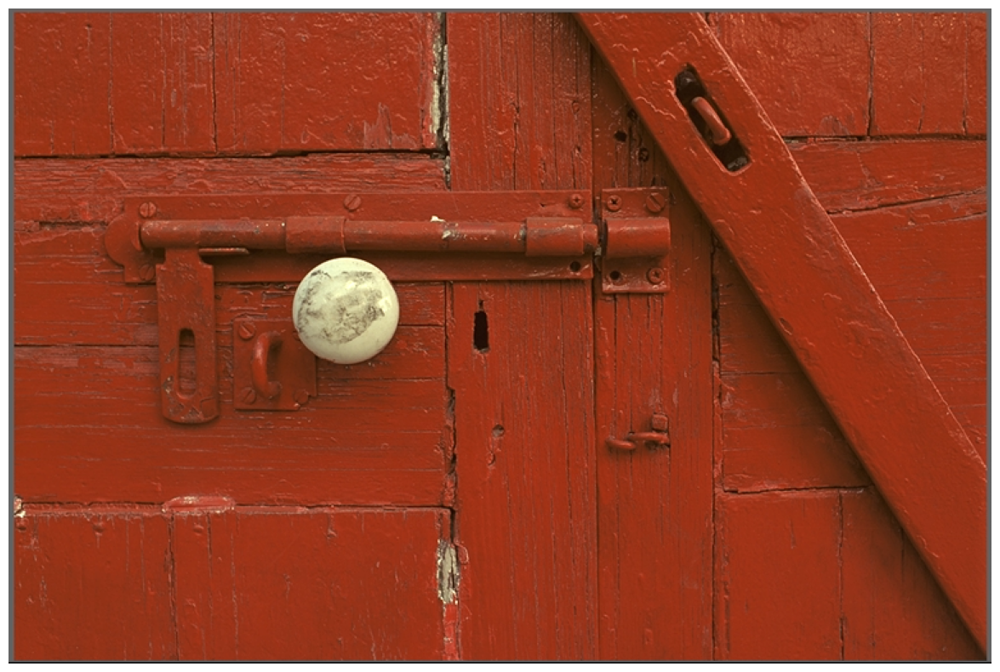

In [85]:
plt.imshow(im[1,:,:,:])
plt.axis('off')

### Color sampling functions

In [86]:
#This is the filter array for Bayer color sampling
def bayerCFA(shape,dtype='none'):
    kernel = np.array([[[1,0,0],[0,0,0]],[[0,0,0],[0,0,0]]])
    kernel = np.stack((kernel,np.array([[[0,0,0],[0,1,0]],[[0,0,0],[0,0,0]]]),np.array([[[0,0,0],[0,0,0]],[[0,1,0],[0,0,0]]]),np.array([[[0,0,0],[0,0,0]],[[0,0,0],[0,0,1]]] )),axis=-1)
    return kernel

In [87]:
# This network transforms a 32 by 32 color image into a 16 by 16 by 4 bayer sample array
inputs = layers.Input(shape=(None,None,3))
cfa = layers.Conv2D(4, (2,2), (2,2), use_bias=False, input_shape=(32,32,3),kernel_initializer=bayerCFA, trainable=False)(inputs)
cfaSample=Model(inputs,cfa)

In [88]:
def rgb2bayerGR2(image):
  w,h, c=image.shape
  bayer=np.zeros((w,h))
  bayer[0:w:2,0:h:2]=image[0:w:2,0:h:2,1]
  bayer[1:w:2,1:h:2]=image[1:w:2,1:h:2,1]
  bayer[0:w:2,1:h:2]=image[0:w:2,1:h:2,0]
  bayer[1:w:2,0:h:2]=image[1:w:2,0:h:2,2]
  bayer=255*bayer/np.max(bayer)
  bayer=bayer.astype('uint8')
  return bayer

In [89]:
sampleImg = cfaSample.predict(im[3:4,:,:,:])

1/1 [==============================] - 0s 75ms/step


(-0.5, 383.5, 255.5, -0.5)

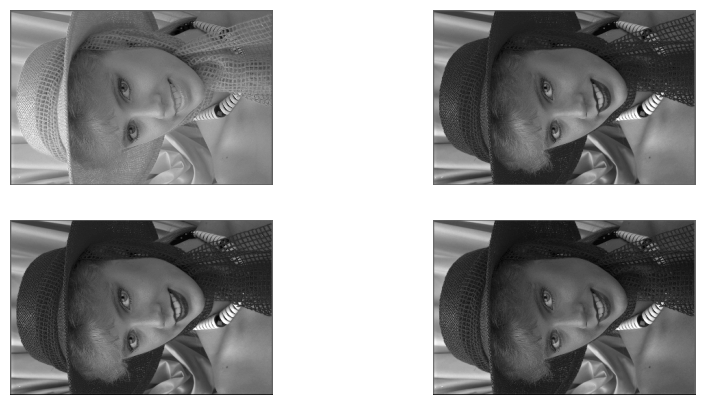

In [11]:
plt.rcParams['figure.figsize'] = [10, 5]
plt.gray()
plt.subplot(2,2,1)
plt.imshow(sampleImg[0,:,:,0])
plt.axis('off')
plt.subplot(2,2,2)
plt.imshow(sampleImg[0,:,:,1])
plt.axis('off')
plt.subplot(2,2,3)
plt.imshow(sampleImg[0,:,:,2])
plt.axis('off')
plt.subplot(2,2,4)
plt.imshow(sampleImg[0,:,:,3])
plt.axis('off')

### Training Blocks

Each image consists of 4 by 6=24 128 by 128 blocks. We use the first 20 images to generate 480 training images and the last 4 images to generate 96 test images

In [12]:
trainS=480
testS=96
xtrain=np.zeros((trainS,64,64,4))
ytrain=np.zeros((trainS,128,128,3))
xtest=np.zeros((testS,64,64,4))
ytest=np.zeros((testS,128,128,3))
for imc in range(20):
  for row in range(4):
    for column in range(6):
      ytrain[(imc*24+row*6+column),:,:,:]=im[imc,(row*128):((row+1)*128),(column*128):((column+1)*128),:]
      xtrain[(imc*24+row*6+column),:,:,:]=cfaSample.predict(im[imc:(imc+1),(row*128):((row+1)*128),(column*128):((column+1)*128),:])
for imc in range(4):
  for row in range(4):
    for column in range(6):
      ytest[(imc*24+row*6+column),:,:,:]=im[imc+20,(row*128):((row+1)*128),(column*128):((column+1)*128),:]
      xtest[(imc*24+row*6+column),:,:,:]=cfaSample.predict(im[(imc+20):(imc+21),(row*128):((row+1)*128),(column*128):((column+1)*128),:])
xtrain=np.reshape(xtrain, (len(xtrain), 64, 64, 4))
ytrain=np.reshape(ytrain, (len(ytrain), 128, 128, 3))
xtest=np.reshape(xtest, (len(xtest), 64, 64, 4))
ytest=np.reshape(ytest, (len(ytest), 128, 128, 3))
train_dataset = tf.data.Dataset.from_tensor_slices((xtrain, ytrain))
test_dataset = tf.data.Dataset.from_tensor_slices((xtest,ytest))
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 100

train_dataset = train_dataset.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_dataset = test_dataset.batch(BATCH_SIZE)

1/1 [==============================] - 0s 39ms/step


## Network Architecture

autoencoder with residuals

In [16]:
inputs = layers.Input(shape=(None,None,4))
# Encoder
x1 = layers.Conv2D(16, (2, 2), strides=2, activation="gelu", padding="same")(inputs)
x = layers.MaxPooling2D((2, 2))(x1)
x2 = layers.Conv2D(16, (3, 3), activation="gelu", padding="same")(x)
x3 = layers.Conv2D(16, (3, 3), strides=2, activation="relu", padding="same")(x2)
x = layers.MaxPooling2D((2, 2))(x3)
x = layers.Conv2D(16, (3, 3),  activation="gelu", padding="same")(x)
# Decoder
x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)

x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)
x=layers.add([x,x2])
x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)
x=layers.add([x,x1])
x = layers.Conv2DTranspose(4, (3, 3), strides=2, activation="gelu", padding="same")(x)
x=layers.add([x,inputs])
x = layers.Conv2DTranspose(3, (3, 3), strides=2, activation="gelu", padding="same")(x)
x = layers.Conv2D(3, (3, 3), activation="relu", padding="same")(x)

# Autoencoder
demosaic = Model(inputs, x)
demosaic.compile(optimizer="adam", loss="mean_squared_error")
demosaic.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 4)]      0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, None, None, 16)       272       ['input_1[0][0]']             
                                                                                                  
 max_pooling2d (MaxPooling2  (None, None, None, 16)       0         ['conv2d[0][0]']              
 D)                                                                                               
                                                                                                  
 conv2d_1 (Conv2D)           (None, None, None, 16)       2320      ['max_pooling2d[0][0]']   

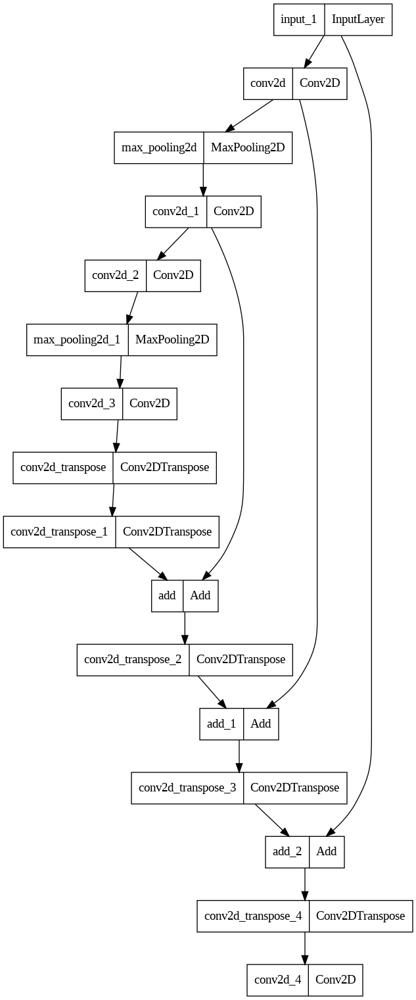

In [17]:
keras.utils.plot_model(demosaic)

In [18]:
demosaic.fit(train_dataset,
    epochs=1000,
    batch_size=32,
    shuffle=True,
    validation_data=test_dataset
)

NameError: ignored

In [ ]:
demosaic.save("demosaic")
!tar -czvf demosaic.tar.gz demosaic/
files.download('demosaic.tar.gz')

### Test of the samples not trained

In [19]:
sampleImg=demosaic.predict(cfaSample.predict(im[22:23,:,:,:]))

NameError: ignored

In [ ]:
plt.figure(figsize=(30,15))
plt.subplot(2,3,1)
plt.title('CNN Demosaic')
plt.imshow(sampleImg[0,:,:,:])
plt.axis('off')
plt.subplot(2,3,2)
plt.title('Ground Truth')
plt.imshow(im[22,:,:,:])
plt.axis('off')
plt.subplot(2,3,3)
plt.title('openCV Demosaic')
plt.imshow(cv2.cvtColor(rgb2bayerGR2(im[22,:,:,:]), cv2.COLOR_BayerGR2BGR))
plt.axis('off')
plt.subplot(2,3,4)
plt.imshow(sampleImg[0,175:275,125:225,:])
plt.axis('off')
plt.subplot(2,3,5)
plt.imshow(im[22,175:275,125:225,:])
plt.axis('off')
plt.subplot(2,3,6)
plt.imshow(cv2.cvtColor(rgb2bayerGR2(im[22,175:275,125:225,:]), cv2.COLOR_BayerGR2BGR))

### Results of training

On the left there is the trained algorithm where we can see it very close to the ground truth image, the middle image. The openCV demosaic has a more blurred version of the ground truth but is also less blocky and more uniform across the image.

## Smart phone photo comparison

The smart phone I am using is the Apple Iphone 14 pro. The native file format for the apple is HEIC and the RAW format is the ProRAW which is not a true RAW format. It is something inbetween a png and a HEIC (post demosaicing). Using an app called Halide Mark II - Pro Camera, RAW smart phone images can be taken in png format. The photos can be outputed in HEIC format too at the time of capture. This version was used for the comparison following.

### Bayer pattern

In [57]:
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/PhoneImg/PhoneImg.jpg'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/PhoneImg/PhoneImgR.dng'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/smartPhone/smartPhone.jpg'
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/images/smartPhone/smartPhoneR.dng'

--2023-10-04 05:01:28--  https://github.com/JudsonLima/computationalImaging/raw/master/images/PhoneImg/PhoneImg.jpg
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/PhoneImg/PhoneImg.jpg [following]
--2023-10-04 05:01:28--  https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/images/PhoneImg/PhoneImg.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2928321 (2.8M) [image/jpeg]
Saving to: ‘PhoneImg.jpg’

PhoneImg.jpg        100%[===================>]   2.79M  --.-KB/s    in 0.08s   

2023-10-04 05:01:28 (36.4 MB/s) - ‘PhoneImg.jpg

In [58]:
raw1 = rawpy.imread('PhoneImgR.dng')
rawImage1=raw1.raw_image_visible

raw2 = rawpy.imread('smartPhoneR.dng')
rawImage2=raw2.raw_image_visible

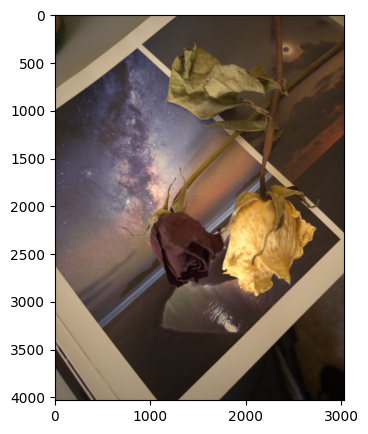

In [24]:
plt.imshow(raw1.postprocess())

(-0.5, 99.5, 99.5, -0.5)

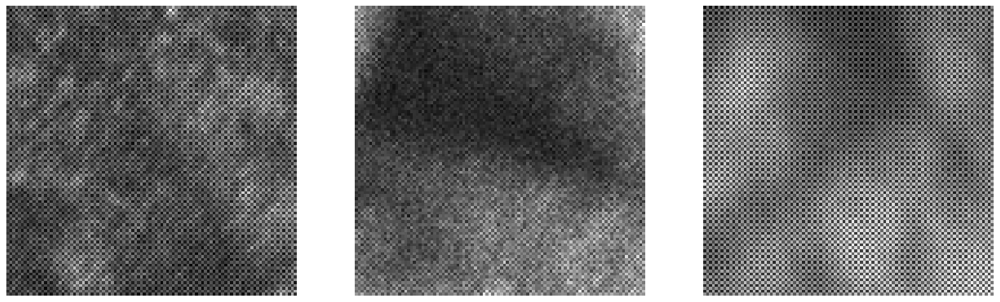

In [64]:
plt.gray()
plt.rcParams['figure.figsize'] = [20, 10]
plt.subplot(1,3,1)
plt.imshow(rawImage1[2100:2200,1800:1900])
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(rawImage1[1600:1700,2500:2600])
plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(rawImage1[1000:1100,2600:2700])
plt.axis('off')

Star night (blue), Flower1 (maroon), and Flower2 (yellow)

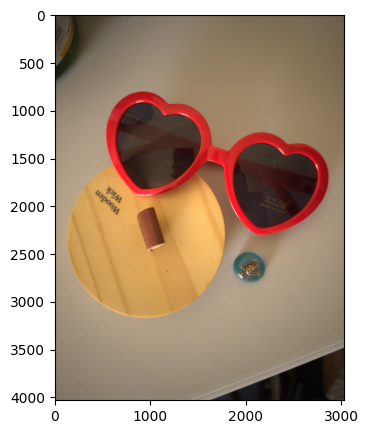

In [25]:
plt.imshow(raw2.postprocess())

(-0.5, 99.5, 99.5, -0.5)

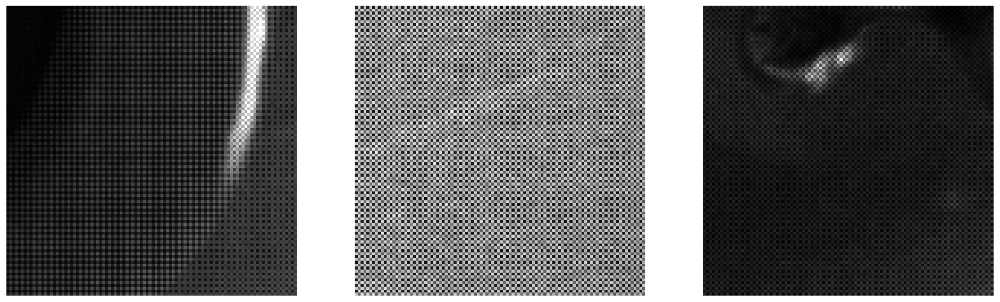

In [192]:
plt.gray()
plt.rcParams['figure.figsize'] = [20, 10]
plt.subplot(1,3,1)
plt.imshow(rawImage2[2100:2200,1800:1900])
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(rawImage2[1700:1800,2750:2850])
plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(rawImage2[1050:1150,2600:2700])
plt.axis('off')

Glasses (red), wood (Tan), Pearl (blue)

In [46]:

imgr=np.zeros((2,2688,4032,3))
h = 2688
w = 4032
for pop1 in range(1,2):
  fileN1="PhoneImgR.dng"
  imr1 = Image.open(fileN1).crop((0, 168, w, h+168))
  imr2=np.array(imr1)
  w,h,c =imr2.shape
  if w>h:
    imr2=imr2.transpose(1,0,2)
  imgr[pop1-1,:,:,:]=np.array(imr2)/255.
for pop1 in range(2,3):
  fileN2="smartPhoneR.dng"
  imr1 = Image.open(fileN2).crop((0, 168, w, h+168))
  imr2=np.array(imr1)
  w,h,c =imr2.shape
  if w>h:
    imr2=imr2.transpose(1,0,2)
  imgr[pop1-1,:,:,:]=np.array(imr2)/255.


(-0.5, 4031.5, 2687.5, -0.5)

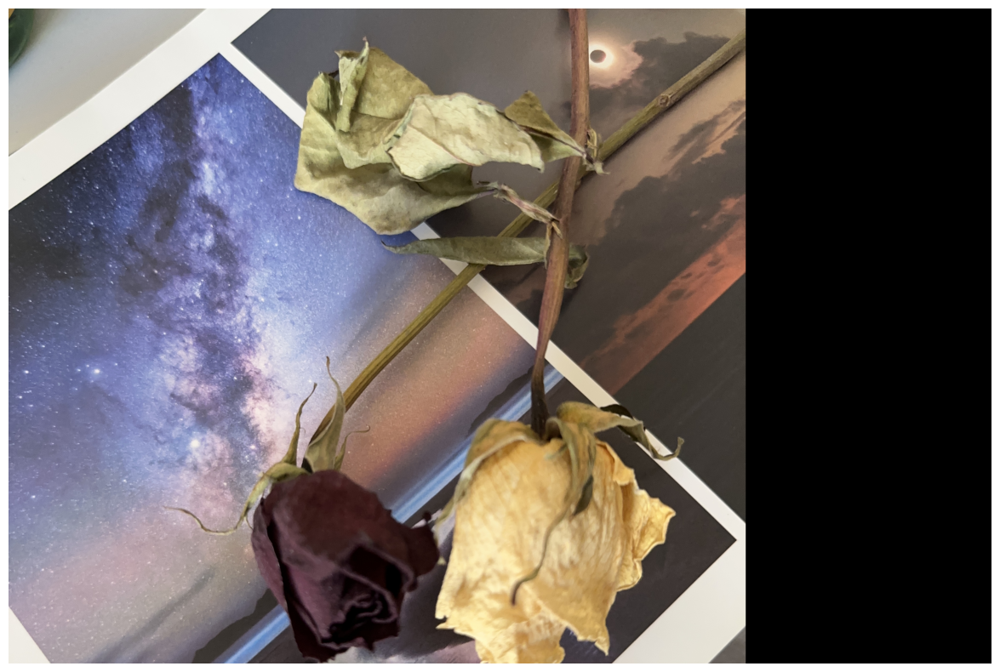

In [47]:
plt.imshow(imgr[0,:,:,:])
plt.axis('off')

(-0.5, 4031.5, 2687.5, -0.5)

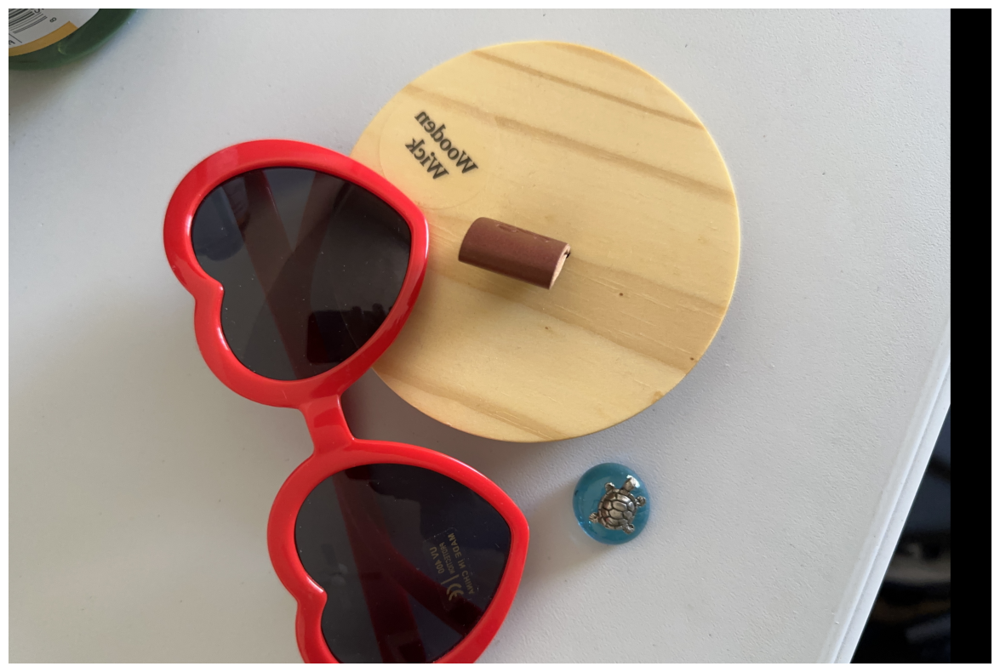

In [221]:
plt.imshow(imgr[1,:,:,:])
plt.axis('off')

### Load Demosaic training module

In [13]:
!wget --no-check-certificate --content-disposition 'https://github.com/JudsonLima/computationalImaging/raw/master/inverseProblems/Demosaic_10_03/demosaic.tar.gz'
!tar -xvf demosaic.tar.gz

--2023-10-04 04:21:43--  https://github.com/JudsonLima/computationalImaging/raw/master/inverseProblems/Demosaic_10_03/demosaic.tar.gz
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/inverseProblems/Demosaic_10_03/demosaic.tar.gz [following]
--2023-10-04 04:21:43--  https://raw.githubusercontent.com/JudsonLima/computationalImaging/master/inverseProblems/Demosaic_10_03/demosaic.tar.gz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 214733 (210K) [application/octet-stream]
Saving to: ‘demosaic.tar.gz.1’

demosaic.tar.gz.1   100%[===================>] 209.70K  

In [25]:
demosaic = keras.models.load_model('demosaic')

In [26]:
PhoneImgS1=demosaic.predict(cfaSample.predict(imgr[0:1,:,:,:]))

1/1 [==============================] - 3s 3s/step


(-0.5, 299.5, 299.5, -0.5)

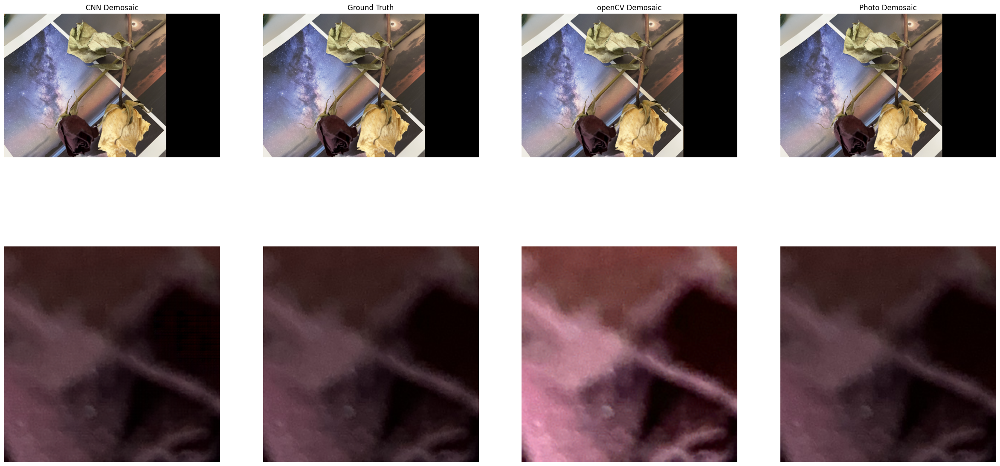

In [74]:


PhoneImg = Image.open("PhoneImg.jpg").crop((0, 168, w, h+168))
imr3=np.array(PhoneImg)/255.


plt.figure(figsize=(30,15))
plt.subplot(2,4,1)
plt.title('CNN Demosaic')
plt.imshow(PhoneImgS1[0,:,:,:])
plt.axis('off')
plt.subplot(2,4,2)
plt.title('Ground Truth')
plt.imshow(imgr[0,:,:,:])
plt.axis('off')
plt.subplot(2,4,3)
plt.title('openCV Demosaic')
plt.imshow(cv2.cvtColor(rgb2bayerGR2(imgr[0,:,:,:]), cv2.COLOR_BayerGR2BGR))
plt.axis('off')
plt.subplot(2,4,4)
plt.title('Photo Demosaic')
plt.imshow(imr3)
plt.axis('off')

plt.subplot(2,4,5)
plt.imshow(PhoneImgS1[0,2150:2450,1200:1500,:])
plt.axis('off')
plt.subplot(2,4,6)
plt.imshow(imgr[0,2150:2450,1200:1500,:])
plt.axis('off')
plt.subplot(2,4,7)
plt.imshow(cv2.cvtColor(rgb2bayerGR2(imgr[0,2150:2450,1200:1500,:]), cv2.COLOR_BayerGR2BGR))
plt.axis('off')
plt.subplot(2,4,8)
plt.imshow(imr3[2150:2450,1200:1500])
plt.axis('off')

In [75]:
PhoneImgS2=demosaic.predict(cfaSample.predict(imgr[1:2,:,:,:]))

1/1 [==============================] - 2s 2s/step


(-0.5, 299.5, 299.5, -0.5)

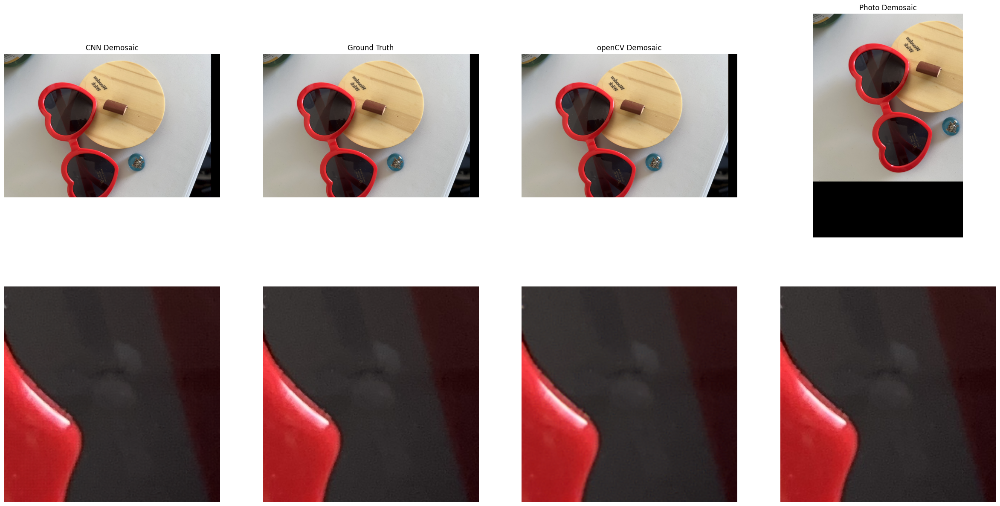

In [80]:


smartPhone = Image.open("smartPhone.jpg").crop((0, 168, w, h+168))
imr4=np.array(smartPhone).transpose(1,0,2)/255.


plt.figure(figsize=(30,15))
plt.subplot(2,4,1)
plt.title('CNN Demosaic')
plt.imshow(PhoneImgS2[0,:,:,:])
plt.axis('off')
plt.subplot(2,4,2)
plt.title('Ground Truth')
plt.imshow(imgr[1,:,:,:])
plt.axis('off')
plt.subplot(2,4,3)
plt.title('openCV Demosaic')
plt.imshow(cv2.cvtColor(rgb2bayerGR2(imgr[1,:,:,:]), cv2.COLOR_BayerGR2BGR))
plt.axis('off')
plt.subplot(2,4,4)
plt.title('Photo Demosaic')
plt.imshow(imr4)
plt.axis('off')

plt.subplot(2,4,5)
plt.imshow(PhoneImgS2[0,2200:2500,1200:1500,:])
plt.axis('off')
plt.subplot(2,4,6)
plt.imshow(imgr[1,2200:2500,1200:1500,:])
plt.axis('off')
plt.subplot(2,4,7)
plt.imshow(cv2.cvtColor(rgb2bayerGR2(imgr[1,2200:2500,1200:1500,:]), cv2.COLOR_BayerGR2BGR))
plt.axis('off')
plt.subplot(2,4,8)
plt.imshow(imr4[2200:2500,1200:1500])
plt.axis('off')

### results

From the results above the phone images done are much more similar to the openCV algorithm. The CNN tends to shapren the image but still does a very good job of demosaicing. There was a bit of a hiccup formatting the files from the phone to 2:3 aspect ratio to match the algorithm. When the original 16:9 was used the photo, the algorithm broke and the arrays needed to be adjusted.

## Adding more layers to the algorithm

In [90]:
trainS=480
testS=96
xtrain=np.zeros((trainS,64,64,4))
ytrain=np.zeros((trainS,128,128,3))
xtest=np.zeros((testS,64,64,4))
ytest=np.zeros((testS,128,128,3))
for imc in range(20):
  for row in range(4):
    for column in range(6):
      ytrain[(imc*24+row*6+column),:,:,:]=im[imc,(row*128):((row+1)*128),(column*128):((column+1)*128),:]
      xtrain[(imc*24+row*6+column),:,:,:]=cfaSample.predict(im[imc:(imc+1),(row*128):((row+1)*128),(column*128):((column+1)*128),:])
for imc in range(4):
  for row in range(4):
    for column in range(6):
      ytest[(imc*24+row*6+column),:,:,:]=im[imc+20,(row*128):((row+1)*128),(column*128):((column+1)*128),:]
      xtest[(imc*24+row*6+column),:,:,:]=cfaSample.predict(im[(imc+20):(imc+21),(row*128):((row+1)*128),(column*128):((column+1)*128),:])
xtrain=np.reshape(xtrain, (len(xtrain), 64, 64, 4))
ytrain=np.reshape(ytrain, (len(ytrain), 128, 128, 3))
xtest=np.reshape(xtest, (len(xtest), 64, 64, 4))
ytest=np.reshape(ytest, (len(ytest), 128, 128, 3))
train_dataset = tf.data.Dataset.from_tensor_slices((xtrain, ytrain))
test_dataset = tf.data.Dataset.from_tensor_slices((xtest,ytest))
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 100

train_dataset = train_dataset.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
test_dataset = test_dataset.batch(BATCH_SIZE)

1/1 [==============================] - 0s 26ms/step


In [146]:
inputs = layers.Input(shape=(None,None,4))
# Encoder
x1 = layers.Conv2D(16, (2, 2), strides=2, activation="gelu", padding="same")(inputs)
x = layers.MaxPooling2D((2, 2))(x1)
x2 = layers.Conv2D(16, (3, 3), activation="gelu", padding="same")(x)
x3 = layers.Conv2D(16, (3, 3), strides=2, activation="relu", padding="same")(x2)
x = layers.MaxPooling2D((2, 2))(x3)

x4 = layers.MaxPooling2D((2, 2))(x)
x5 = layers.Conv2D(16, (3, 3),  activation="gelu", padding="same")(x4)
x = layers.Conv2D(16, (3, 3),  activation="gelu", padding="same")(x5)

# Decoder
x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)
x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)
x=layers.add([x,x3])
x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)

x=layers.add([x,x2])
x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="gelu", padding="same")(x)
x=layers.add([x,x1])
x = layers.Conv2DTranspose(4, (3, 3), strides=2, activation="gelu", padding="same")(x)
x=layers.add([x,inputs])
x = layers.Conv2DTranspose(3, (3, 3), strides=2, activation="gelu", padding="same")(x)
x = layers.Conv2D(3, (3, 3), activation="relu", padding="same")(x)

# Autoencoder
demosaic = Model(inputs, x)
demosaic.compile(optimizer="adam", loss="mean_squared_error")
demosaic.summary()

Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_54 (InputLayer)       [(None, None, None, 4)]      0         []                            
                                                                                                  
 conv2d_287 (Conv2D)         (None, None, None, 16)       272       ['input_54[0][0]']            
                                                                                                  
 max_pooling2d_170 (MaxPool  (None, None, None, 16)       0         ['conv2d_287[0][0]']          
 ing2D)                                                                                           
                                                                                                  
 conv2d_288 (Conv2D)         (None, None, None, 16)       2320      ['max_pooling2d_170[0][

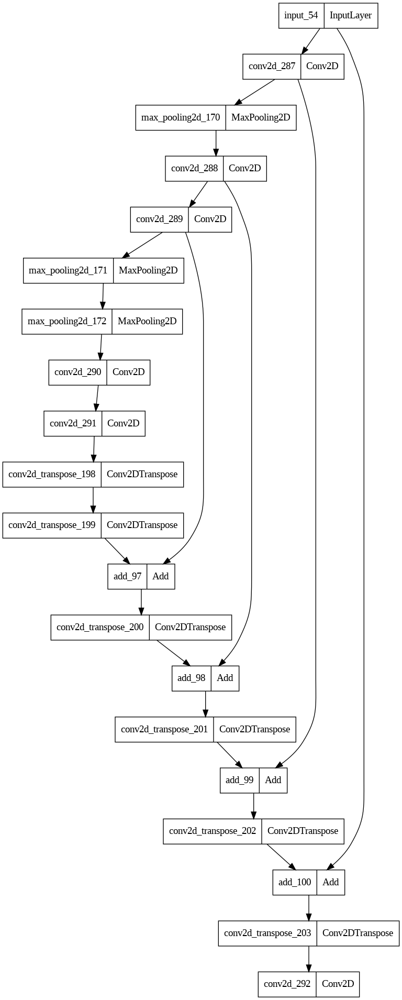

In [147]:
keras.utils.plot_model(demosaic)

In [1]:
demosaic.fit(train_dataset,
    epochs=1000,
    batch_size=32,
    shuffle=True,
    validation_data=test_dataset
)

NameError: ignored

In [115]:
demosaic.save("demosaic")
!tar -czvf demosaic2.tar.gz demosaic/
files.download('demosaic2.tar.gz')

tar: demosaic2: Cannot stat: No such file or directory
tar: Exiting with failure status due to previous errors


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
sampleImg3=demosaic.predict(cfaSample.predict(im[22:23,:,:,:]))

When editing the model it is  difficult to